In [9]:
import graph_tool.all as gt
import matplotlib
import numpy
import random
from scipy.linalg import norm
import matplotlib.pyplot as plt

In [3]:
def read_edgelist(filename, graph, weighted=False):
    with open(filename) as f:
        data = f.readlines()
        data = [item.strip() for item in data]
        data = [item.split(" ") for item in data]
        eprop = graph.new_edge_property("float")
        g.edge_properties["weight"] = eprop
        if weighted:
            data = [[int(item[0]), int(item[1]), float(item[2])] for item in data]
        else:
            data = [[int(item[0]), int(item[1])] for item in data]
        vertexDict = {}
        for edge in data:
            # Check if we have made a vertex object for the start/end of edge
            if edge[0] in vertexDict:
                v1 = vertexDict[edge[0]]
            else:
                v = graph.add_vertex()
                vertexDict[edge[0]] = v
                v1 = vertexDict[edge[0]]
            if edge[1] in vertexDict:
                v2 = vertexDict[edge[1]]
            else:
                # Create the second vertex
                v = graph.add_vertex()
                vertexDict[edge[1]] = v
                v2 = vertexDict[edge[1]]
            e = graph.add_edge(v1, v2)
            if weighted:
                eprop[e] = numpy.absolute(edge[2])
            else:
                eprop[e] = 1
        return graph, vertexDict, eprop

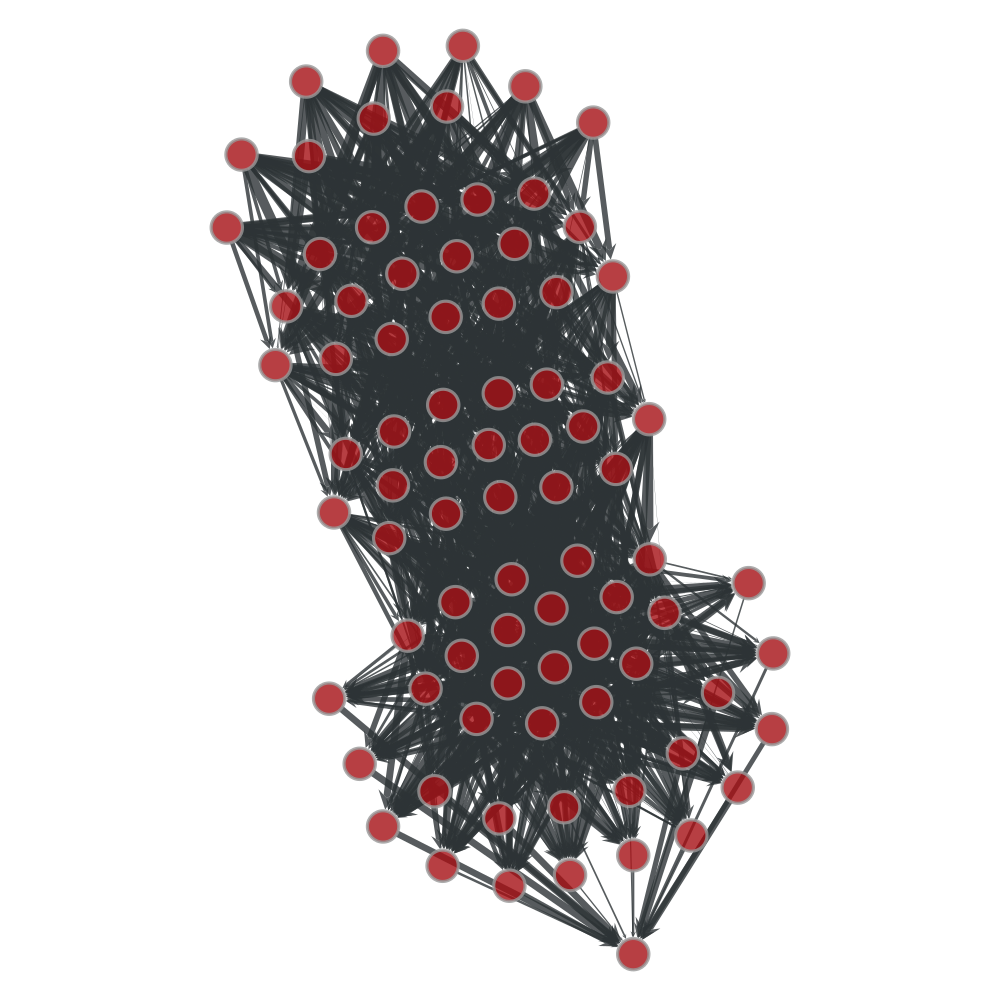

10
1
(<Vertex object with index '27' at 0x7fb76b4cf690>, <Vertex object with index '82' at 0x7fb76b4cf870>, 2.3761848)
Max flow of 2.3761848


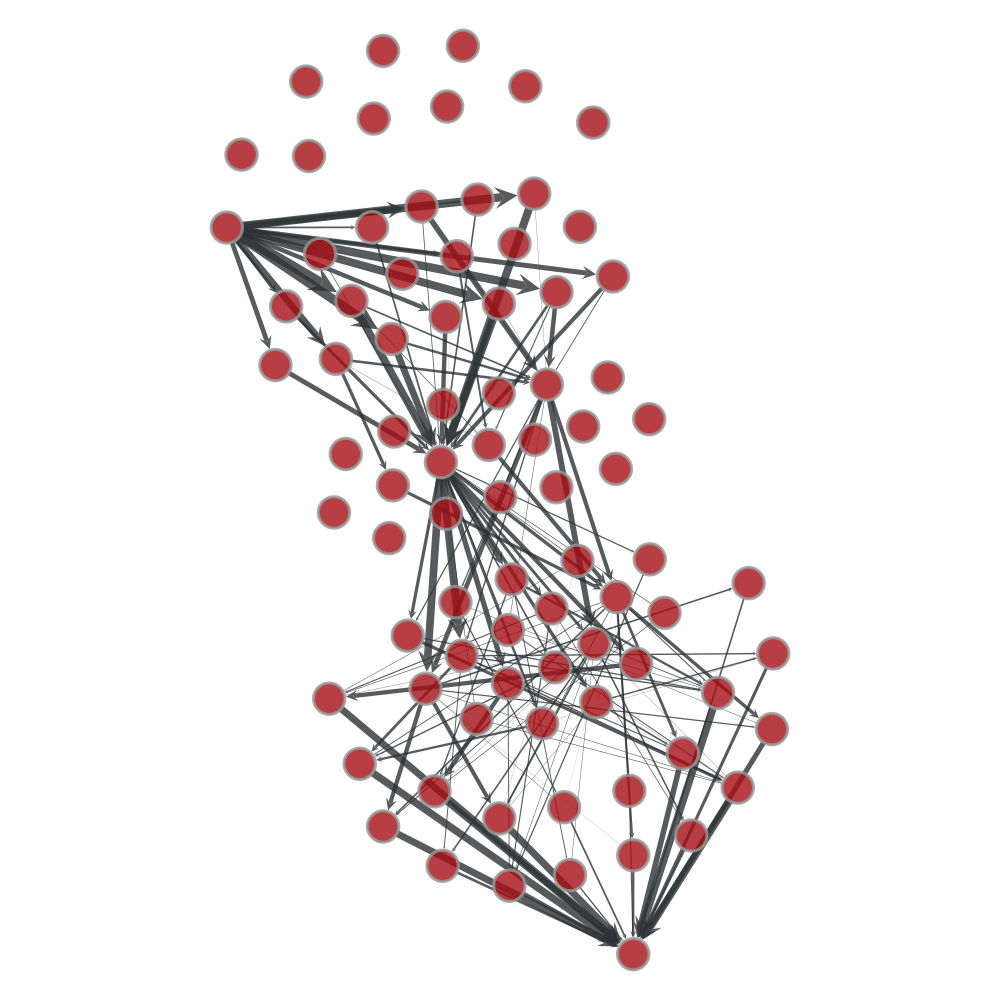

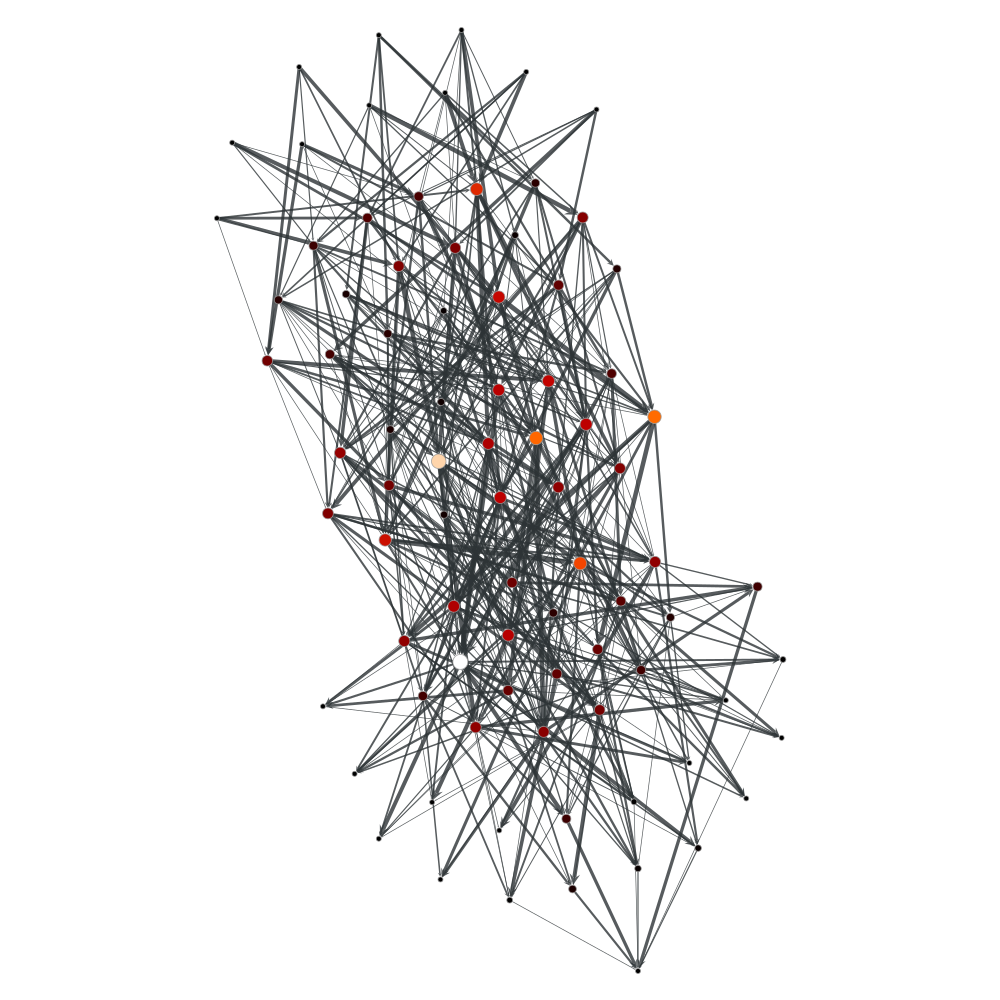

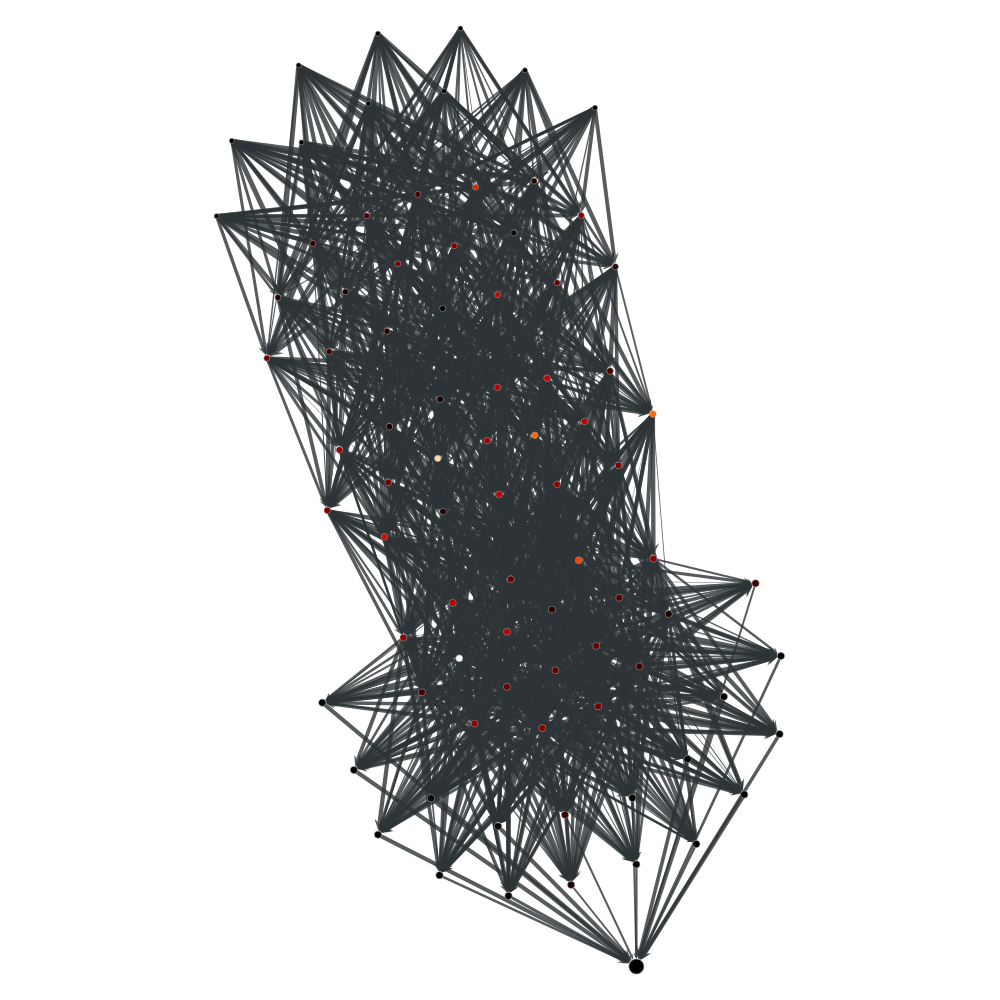

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fb76aa20a20, at 0x7fb76b4fbe10>

In [48]:
g = gt.Graph()

g, vertexDict, e_weight = read_edgelist("constant_binary_converter.adj", g, True)
cap = g.edge_properties["weight"]
pos = gt.sfdp_layout(g)

gt.graph_draw(g, pos=pos, edge_pen_width=gt.prop_to_size(cap, mi=0, ma=10, power=1), output_size=(1000, 1000))

sources = []
sinks = []
for v in g.vertices():
    if v.out_degree() == 0:
        sinks.append(v)
    if v.in_degree() == 0:
        sources.append(v)

print(len(sources))
print(len(sinks))
sr_sk_fl = []
for source in sources:
    for sink in sinks:
        res = gt.push_relabel_max_flow(g, source, sink, cap)
        res.a = cap.a - res.a
        max_flow = sum(res[e] for e in sink.in_edges())
        t = (source, sink, max_flow)
        sr_sk_fl.append(t)
        
maxflow = -1
mflow = None
for flows in sr_sk_fl:
    if flows[2] > maxflow:
        mflow = flows
print(mflow)
print("Max flow of " + str(mflow[2]))

src = mflow[0]
tgt = mflow[1]
res_r = gt.edmonds_karp_max_flow(g, src, tgt, cap)
res_r.a = cap.a - res_r.a
max_flow_r = sum(res_r[e] for e in tgt.in_edges())
gt.graph_draw(g, pos=pos, edge_pen_width=gt.prop_to_size(res_r, mi=0, ma=10, power=1), output_size=(1000, 1000))

vp, ep = gt.betweenness(g, weight=cap)
gt.graph_draw(g, pos=pos, vertex_fill_color=vp, vertex_size=gt.prop_to_size(vp, mi=5, ma=15), edge_pen_width=gt.prop_to_size(ep, mi=0.0, ma=5), vcmap=matplotlib.cm.gist_heat, output_size=(1000, 1000))

pr = gt.pagerank(g)
gt.graph_draw(g, pos=pos, vertex_fill_color=vp, vertex_size=gt.prop_to_size(pr, mi=5, ma=15), edge_pen_width=gt.prop_to_size(cap, mi=0.0, ma=5), vcmap=matplotlib.cm.gist_heat, output_size=(1000, 1000))

== Avg Degrees ==
(14.096385542168674, 0.67375460134524323)
(14.096385542168674, 0.78648300112315872)
== Histograms ==


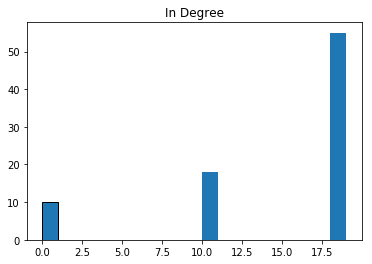

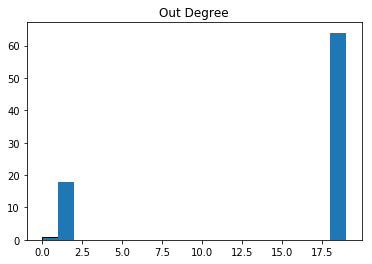

== Betweenness ==


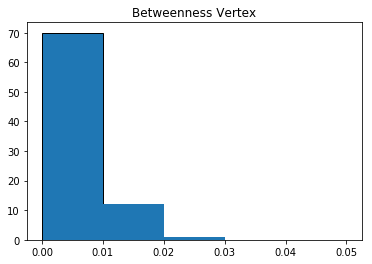

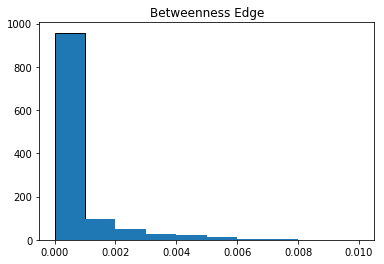

== Pagerank ==


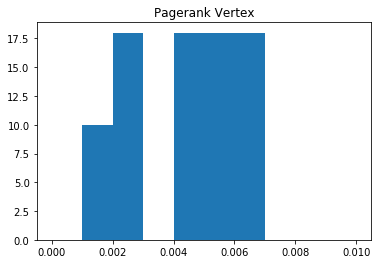

In [49]:
print("== Avg Degrees ==")
print(gt.vertex_average(g, "in"))
print(gt.vertex_average(g, "out"))
print("== Histograms ==")
frq, edges = gt.vertex_hist(g, "in")
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("In Degree")
plt.show()

frq, edges = gt.vertex_hist(g, "out")
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Out Degree")
plt.show()

print("== Betweenness ==")
frq, edges = gt.vertex_hist(g, vp, bins=[0,.01, .02, .03, 0.04, .05])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Betweenness Vertex")
plt.show()

frq, edges = gt.edge_hist(g, ep, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Betweenness Edge")
plt.show()

print("== Pagerank ==")
frq, edges = gt.vertex_hist(g, pr, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Pagerank Vertex")
plt.show()

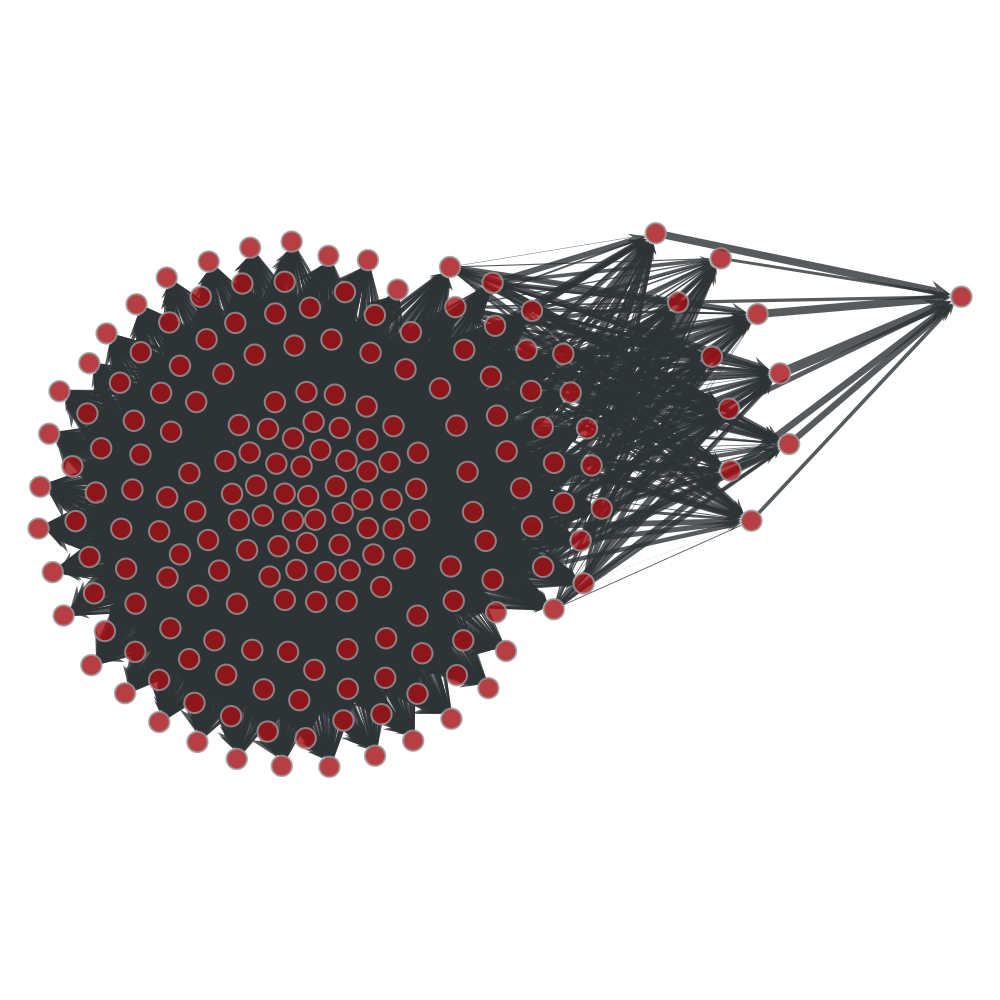

10
1
(<Vertex object with index '109' at 0x7fb7701cab10>, <Vertex object with index '195' at 0x7fb7701caab0>, 1.6631263980000002)
Max flow of 1.6631263980000002


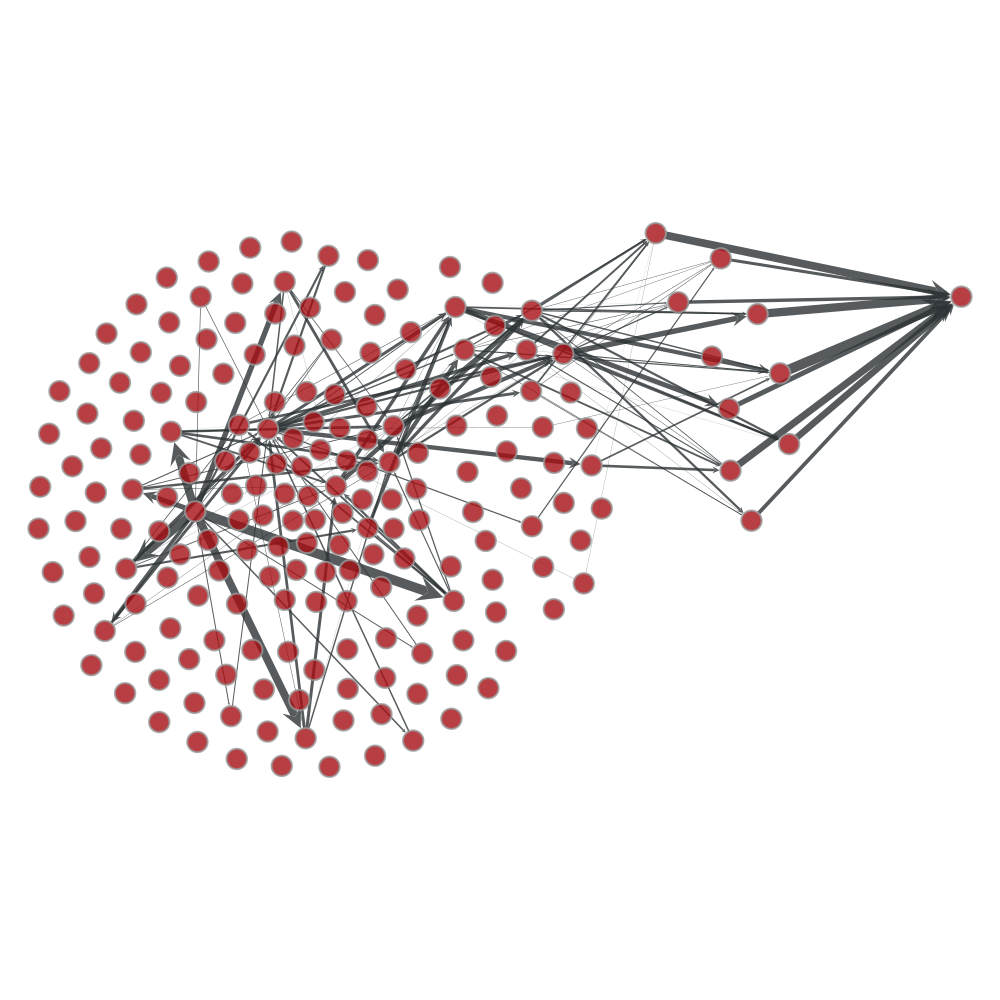

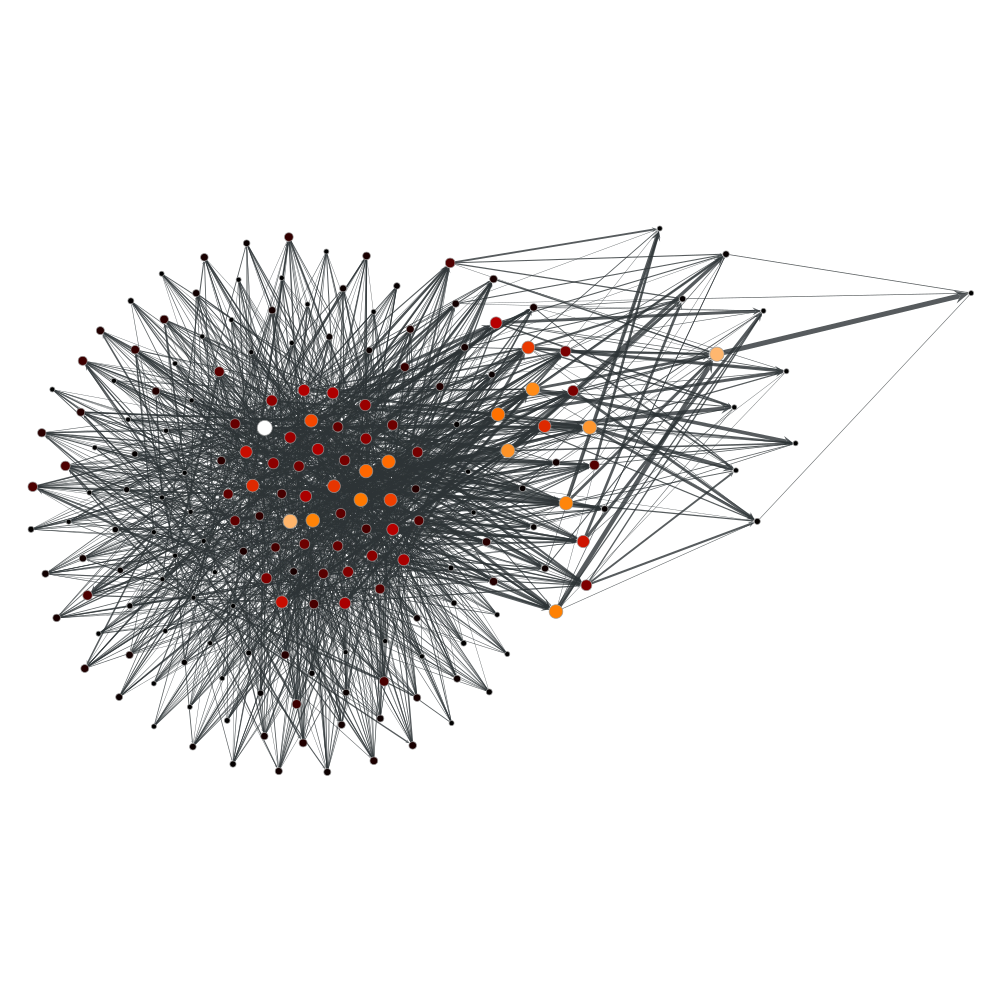

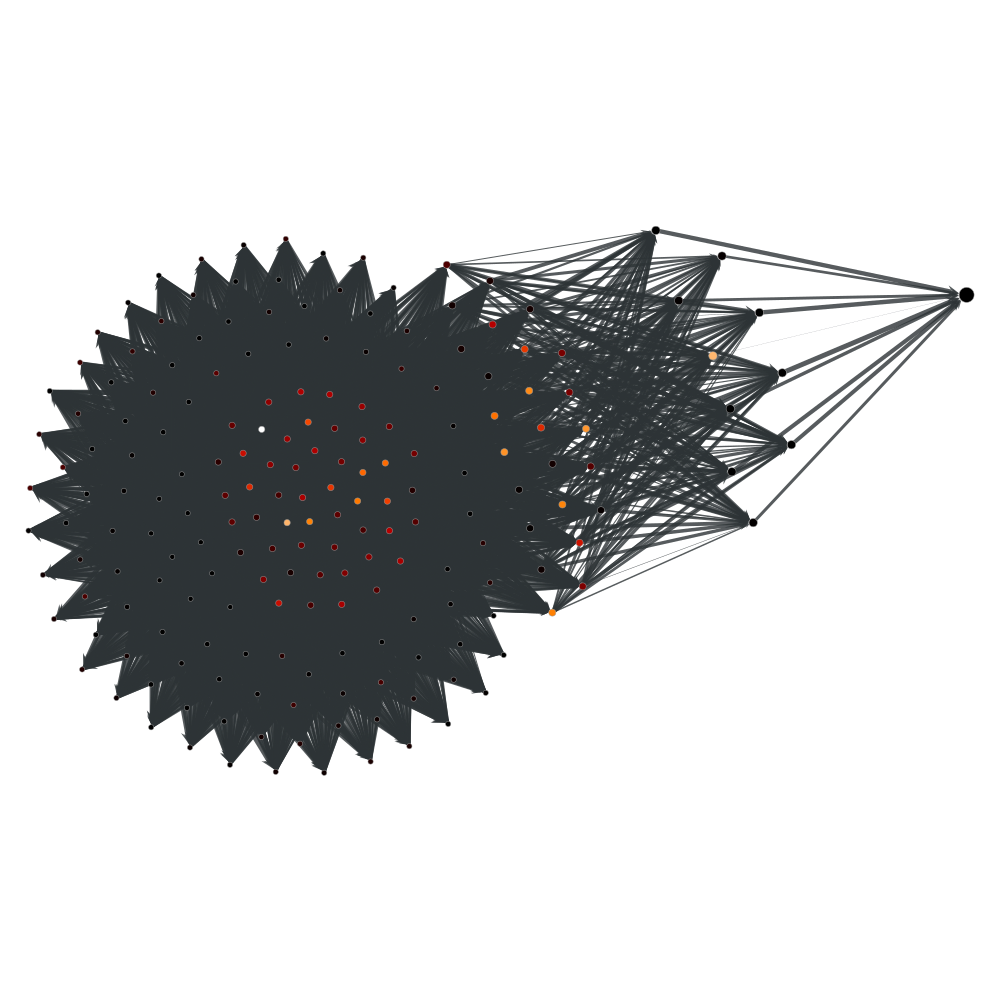

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fb76ac1f8d0, at 0x7fb7700a4b00>

In [50]:
g = gt.Graph()

g, vertexDict, e_weight = read_edgelist("narrow_binary_converter.adj", g, True)
cap = g.edge_properties["weight"]
pos = gt.sfdp_layout(g)

gt.graph_draw(g, pos=pos, edge_pen_width=gt.prop_to_size(cap, mi=0, ma=10, power=1), output_size=(1000, 1000))

sources = []
sinks = []
for v in g.vertices():
    if v.out_degree() == 0:
        sinks.append(v)
    if v.in_degree() == 0:
        sources.append(v)

print(len(sources))
print(len(sinks))
sr_sk_fl = []
for source in sources:
    for sink in sinks:
        res = gt.push_relabel_max_flow(g, source, sink, cap)
        res.a = cap.a - res.a
        max_flow = sum(res[e] for e in sink.in_edges())
        t = (source, sink, max_flow)
        sr_sk_fl.append(t)
        
maxflow = -1
mflow = None
for flows in sr_sk_fl:
    if flows[2] > maxflow:
        mflow = flows
print(mflow)
print("Max flow of " + str(mflow[2]))

src = mflow[0]
tgt = mflow[1]
res_r = gt.edmonds_karp_max_flow(g, src, tgt, cap)
res_r.a = cap.a - res_r.a
max_flow_r = sum(res_r[e] for e in tgt.in_edges())
gt.graph_draw(g, pos=pos, edge_pen_width=gt.prop_to_size(res_r, mi=0, ma=10, power=1), output_size=(1000, 1000))

vp, ep = gt.betweenness(g, weight=cap)
gt.graph_draw(g, pos=pos, vertex_fill_color=vp, vertex_size=gt.prop_to_size(vp, mi=5, ma=15), edge_pen_width=gt.prop_to_size(ep, mi=0.0, ma=5), vcmap=matplotlib.cm.gist_heat, output_size=(1000, 1000))

pr = gt.pagerank(g)
gt.graph_draw(g, pos=pos, vertex_fill_color=vp, vertex_size=gt.prop_to_size(pr, mi=5, ma=15), edge_pen_width=gt.prop_to_size(cap, mi=0.0, ma=5), vcmap=matplotlib.cm.gist_heat, output_size=(1000, 1000))

== Avg Degrees ==
(38.316326530612244, 2.7527124357122856)
(38.316326530612244, 1.5808456547195757)
== Histograms ==


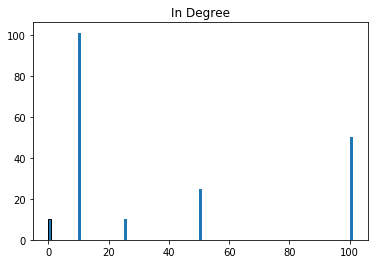

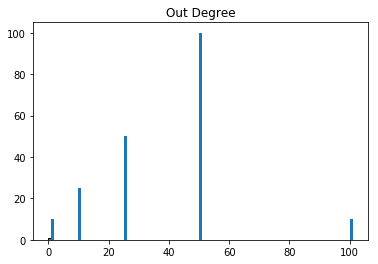

== Betweenness ==


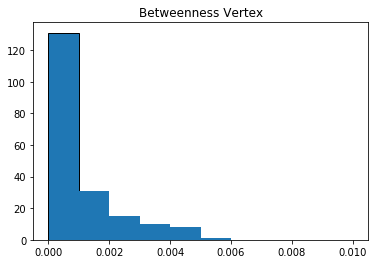

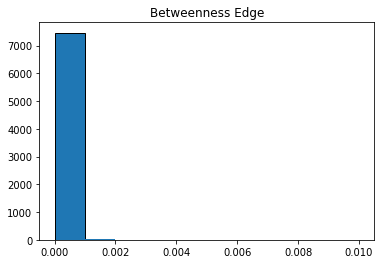

== Pagerank ==


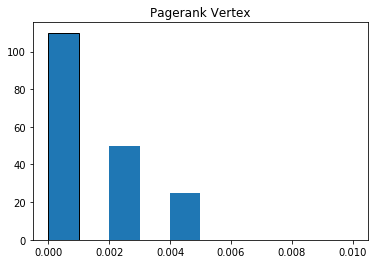

In [52]:
print("== Avg Degrees ==")
print(gt.vertex_average(g, "in"))
print(gt.vertex_average(g, "out"))
print("== Histograms ==")
frq, edges = gt.vertex_hist(g, "in")
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("In Degree")
plt.show()

frq, edges = gt.vertex_hist(g, "out")
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Out Degree")
plt.show()

print("== Betweenness ==")
frq, edges = gt.vertex_hist(g, vp, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Betweenness Vertex")
plt.show()

frq, edges = gt.edge_hist(g, ep, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Betweenness Edge")
plt.show()

print("== Pagerank ==")
frq, edges = gt.vertex_hist(g, pr, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Pagerank Vertex")
plt.show()

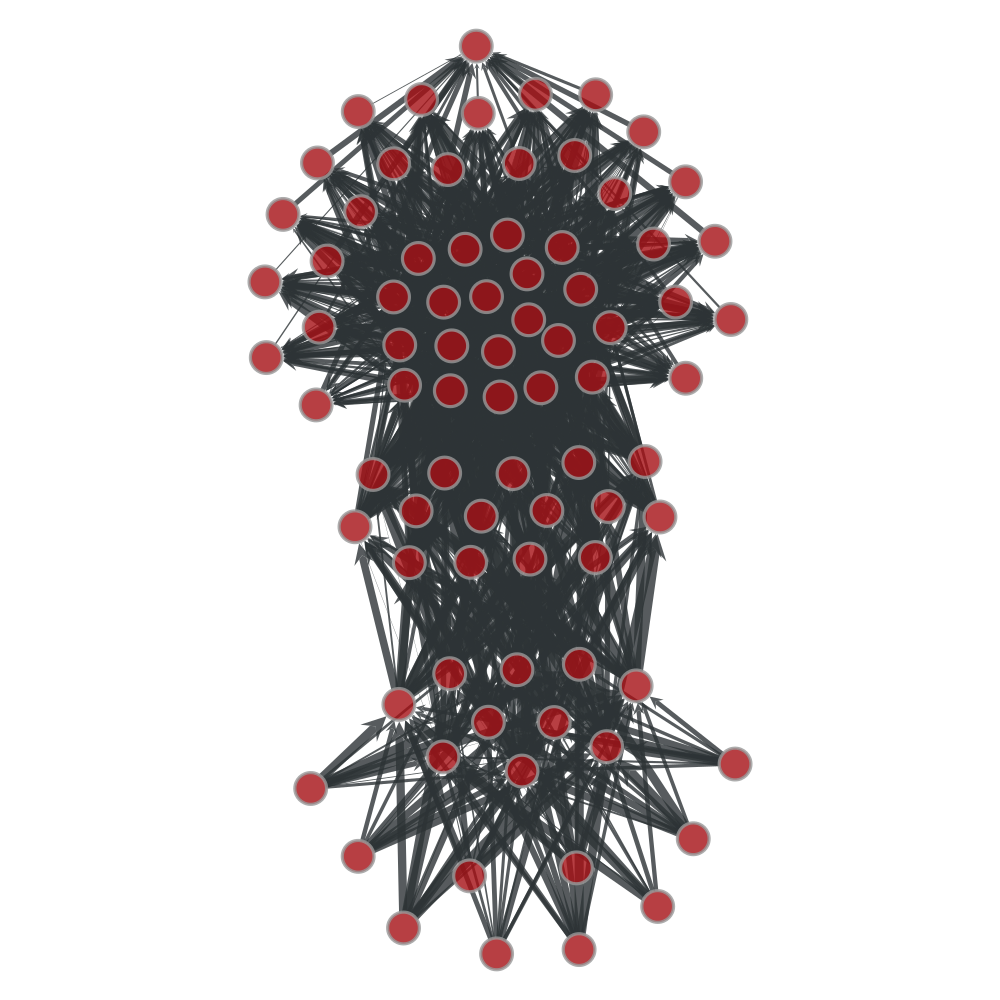

10
1
(<Vertex object with index '19' at 0x7fb770225bd0>, <Vertex object with index '80' at 0x7fb770225b70>, 1.7008537)
Max flow of 1.7008537


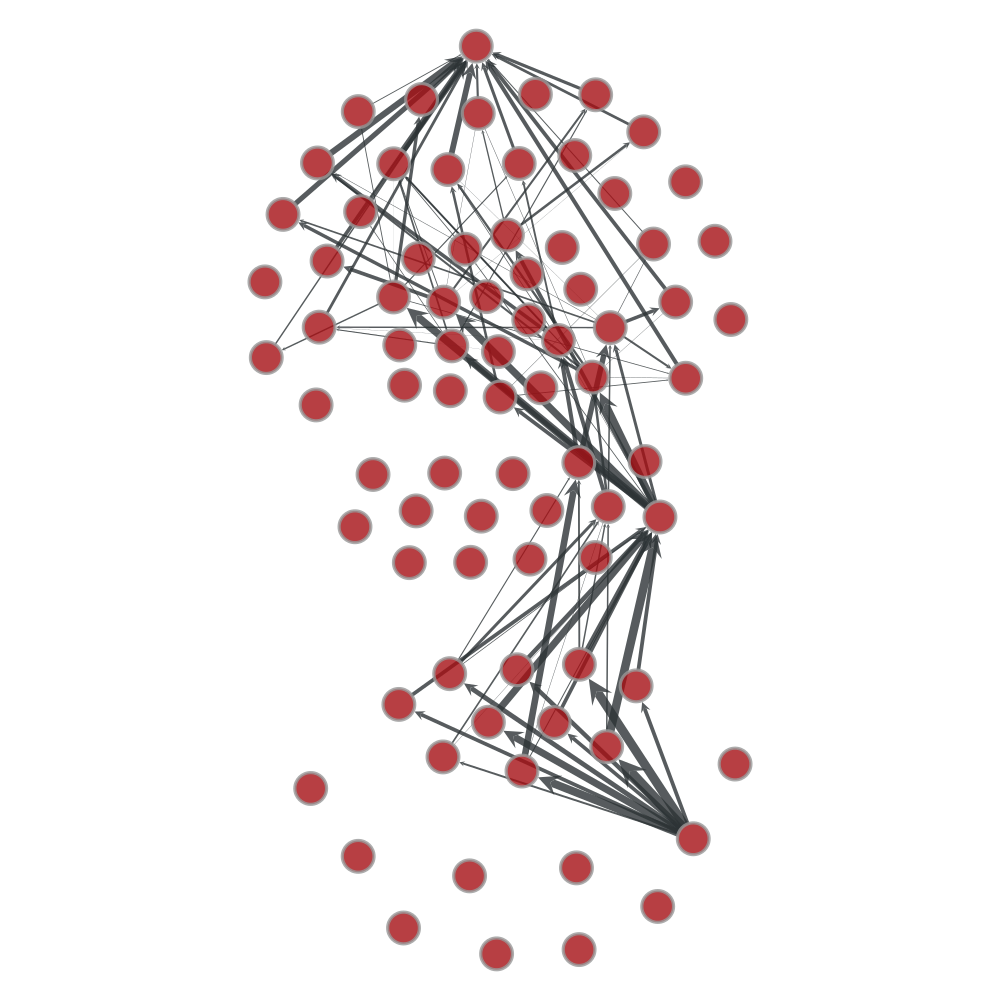

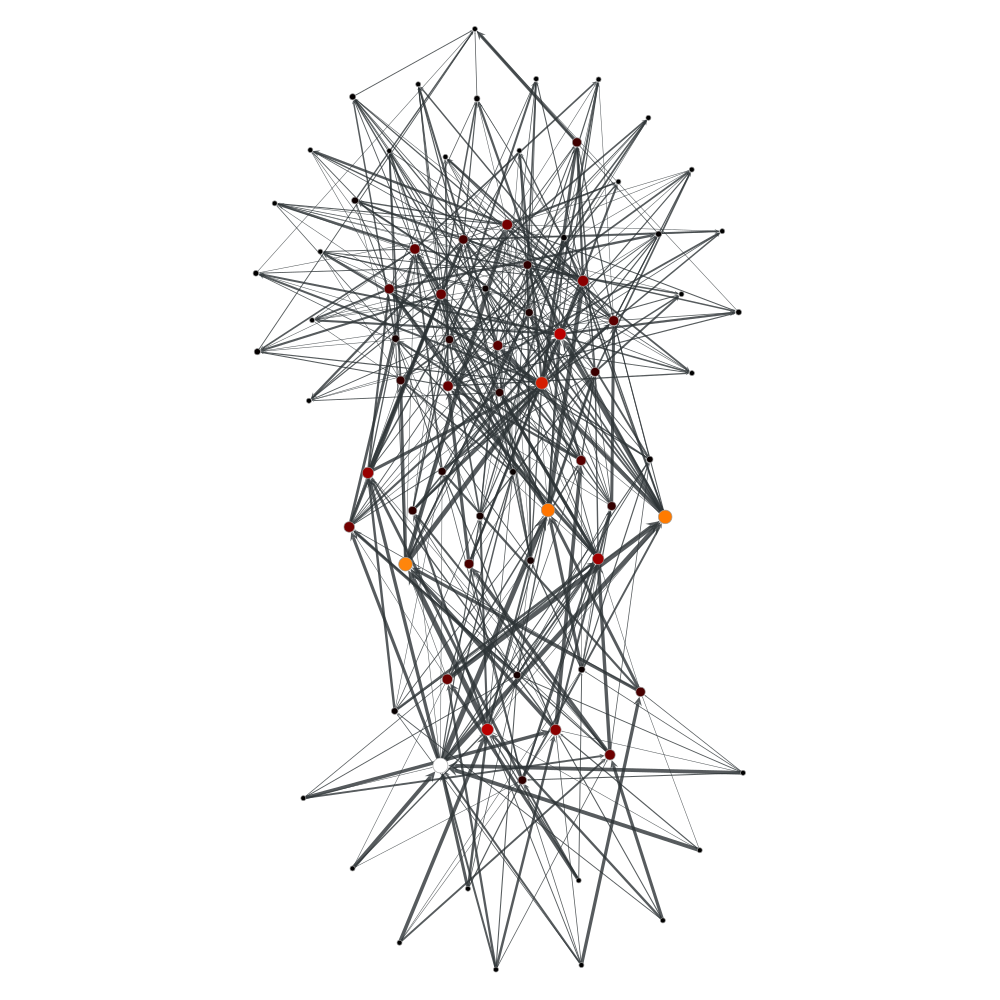

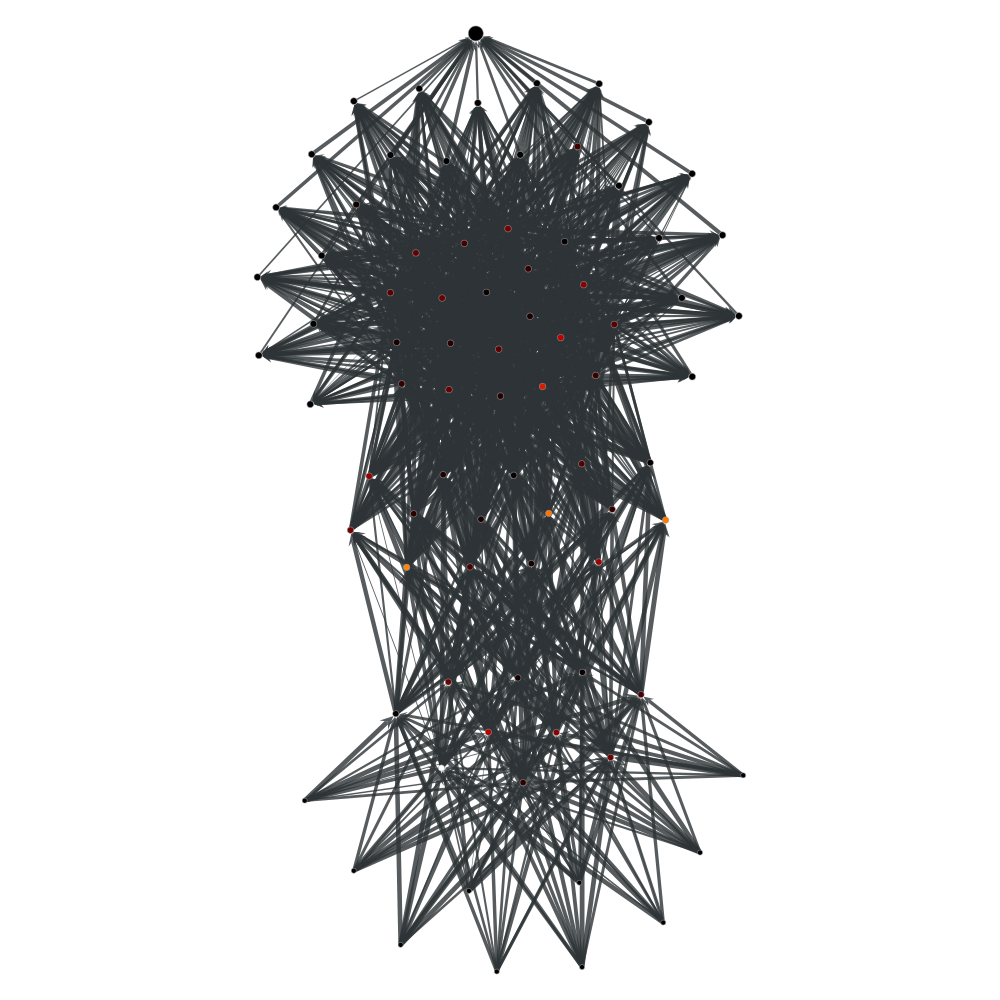

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fb770131a90, at 0x7fb76aa2b780>

In [53]:
g = gt.Graph()

g, vertexDict, e_weight = read_edgelist("wide_binary_converter.adj", g, True)
cap = g.edge_properties["weight"]
pos = gt.sfdp_layout(g)

gt.graph_draw(g, pos=pos, edge_pen_width=gt.prop_to_size(cap, mi=0, ma=10, power=1), output_size=(1000, 1000))

sources = []
sinks = []
for v in g.vertices():
    if v.out_degree() == 0:
        sinks.append(v)
    if v.in_degree() == 0:
        sources.append(v)

print(len(sources))
print(len(sinks))
sr_sk_fl = []
for source in sources:
    for sink in sinks:
        res = gt.push_relabel_max_flow(g, source, sink, cap)
        res.a = cap.a - res.a
        max_flow = sum(res[e] for e in sink.in_edges())
        t = (source, sink, max_flow)
        sr_sk_fl.append(t)
        
maxflow = -1
mflow = None
for flows in sr_sk_fl:
    if flows[2] > maxflow:
        mflow = flows
print(mflow)
print("Max flow of " + str(mflow[2]))

src = mflow[0]
tgt = mflow[1]
res_r = gt.edmonds_karp_max_flow(g, src, tgt, cap)
res_r.a = cap.a - res_r.a
max_flow_r = sum(res_r[e] for e in tgt.in_edges())
gt.graph_draw(g, pos=pos, edge_pen_width=gt.prop_to_size(res_r, mi=0, ma=10, power=1), output_size=(1000, 1000))

vp, ep = gt.betweenness(g, weight=cap)
gt.graph_draw(g, pos=pos, vertex_fill_color=vp, vertex_size=gt.prop_to_size(vp, mi=5, ma=15), edge_pen_width=gt.prop_to_size(ep, mi=0.0, ma=5), vcmap=matplotlib.cm.gist_heat, output_size=(1000, 1000))

pr = gt.pagerank(g)
gt.graph_draw(g, pos=pos, vertex_fill_color=vp, vertex_size=gt.prop_to_size(pr, mi=5, ma=15), edge_pen_width=gt.prop_to_size(cap, mi=0.0, ma=5), vcmap=matplotlib.cm.gist_heat, output_size=(1000, 1000))

== Avg Degrees ==
(13.271604938271604, 0.71541315832127839)
(13.271604938271604, 1.0697389946823934)
== Histograms ==


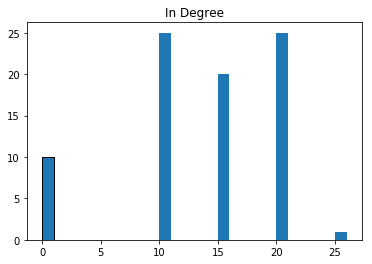

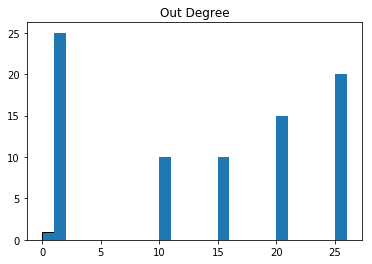

== Betweenness ==


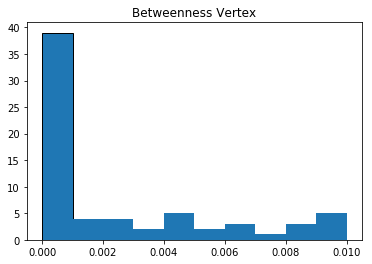

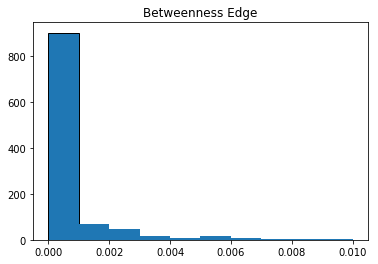

== Pagerank ==


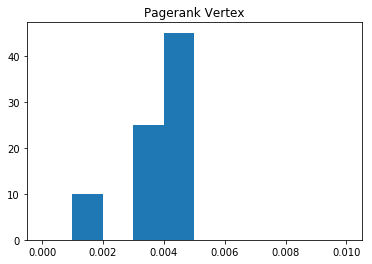

In [54]:
print("== Avg Degrees ==")
print(gt.vertex_average(g, "in"))
print(gt.vertex_average(g, "out"))
print("== Histograms ==")
frq, edges = gt.vertex_hist(g, "in")
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("In Degree")
plt.show()

frq, edges = gt.vertex_hist(g, "out")
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Out Degree")
plt.show()

print("== Betweenness ==")
frq, edges = gt.vertex_hist(g, vp, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Betweenness Vertex")
plt.show()

frq, edges = gt.edge_hist(g, ep, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Betweenness Edge")
plt.show()

print("== Pagerank ==")
frq, edges = gt.vertex_hist(g, pr, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Pagerank Vertex")
plt.show()

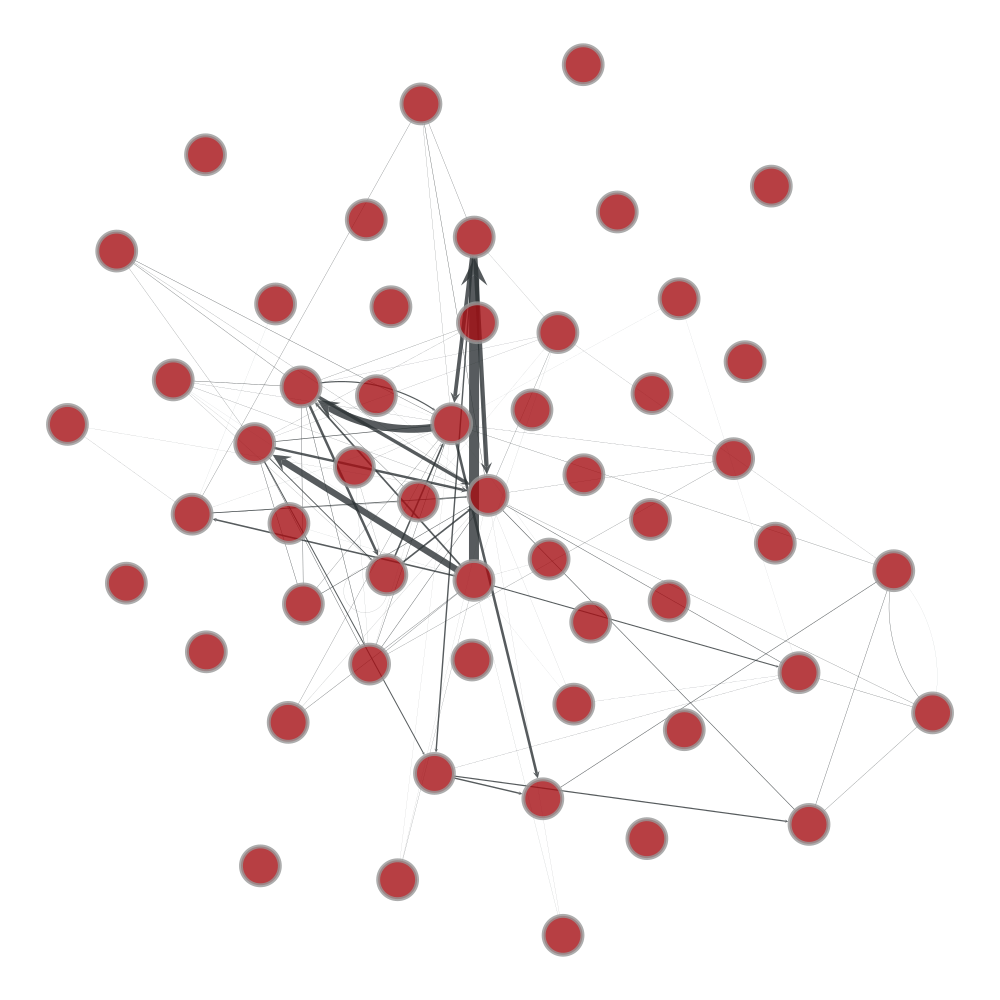

1
2
(<Vertex object with index '0' at 0x7fb77000cc90>, <Vertex object with index '36' at 0x7fb770030990>, 466.9716230999999)
Max flow of 466.9716230999999


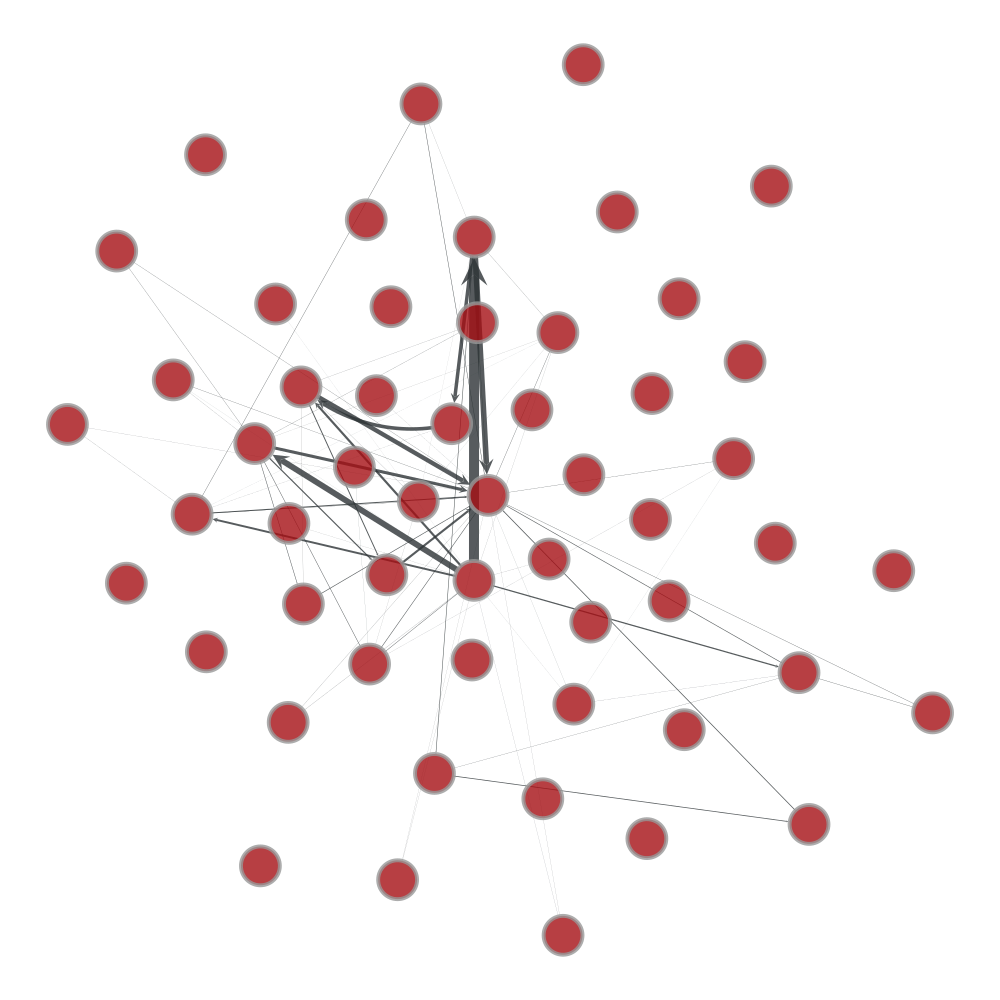

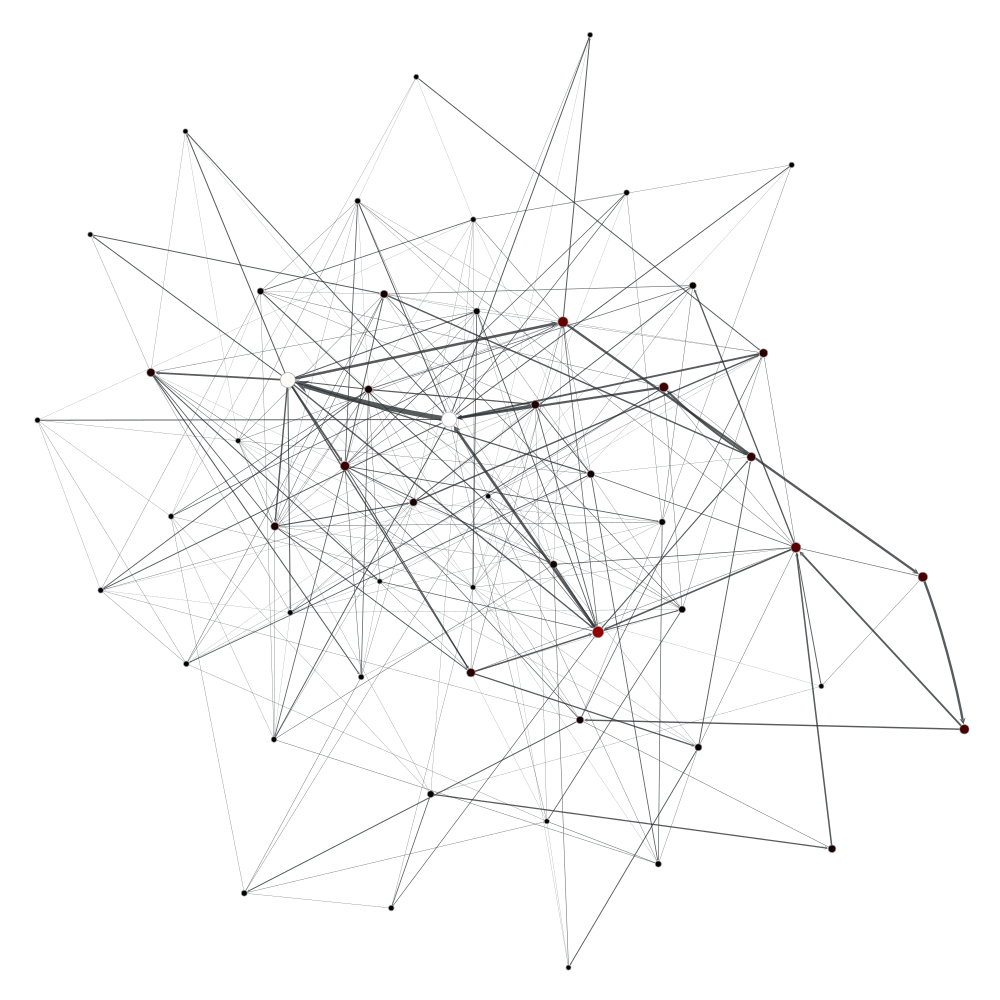

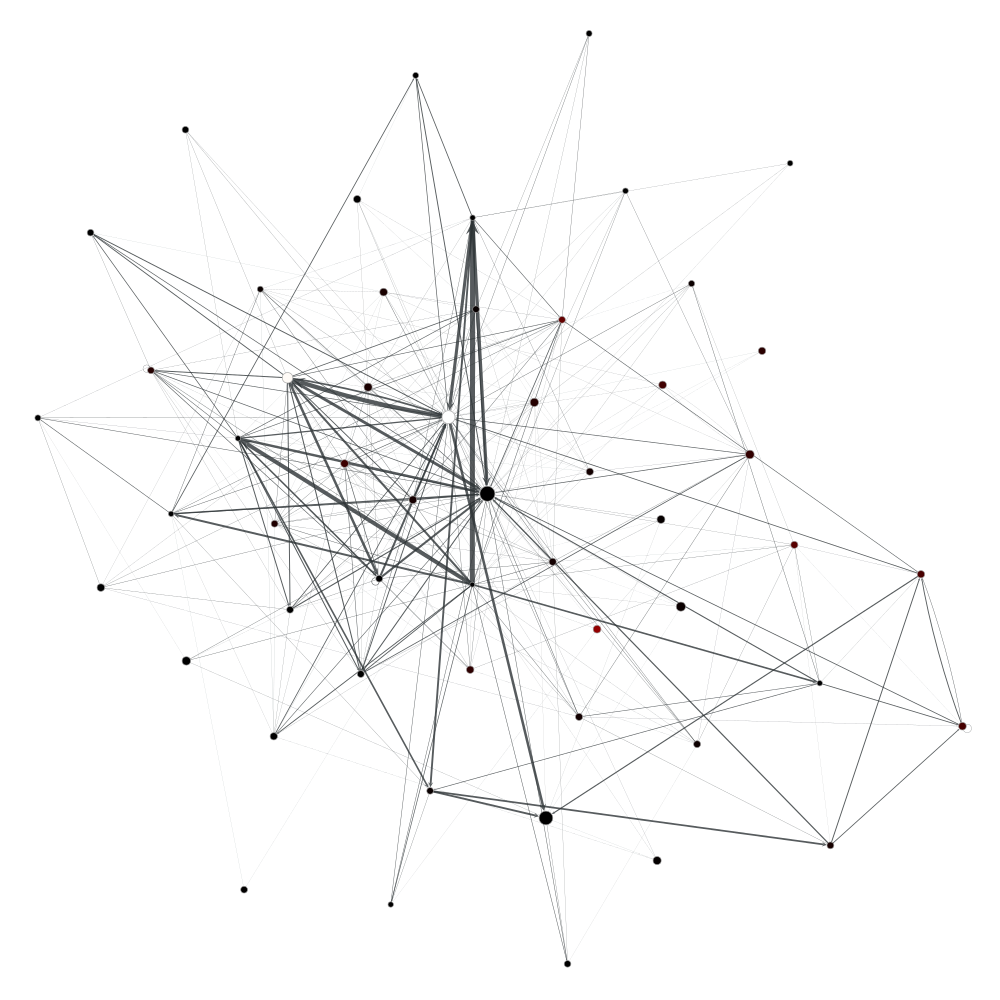

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fb76b4bc9e8, at 0x7fb76b4bc828>

In [55]:
g = gt.Graph()

g, vertexDict, e_weight = read_edgelist("eco-stmarks.edges", g, True)
cap = g.edge_properties["weight"]
pos = gt.sfdp_layout(g)

gt.graph_draw(g, pos=pos, edge_pen_width=gt.prop_to_size(cap, mi=0, ma=10, power=1), output_size=(1000, 1000))

sources = []
sinks = []
for v in g.vertices():
    if v.out_degree() == 0:
        sinks.append(v)
    if v.in_degree() == 0:
        sources.append(v)

print(len(sources))
print(len(sinks))
sr_sk_fl = []
for source in sources:
    for sink in sinks:
        res = gt.push_relabel_max_flow(g, source, sink, cap)
        res.a = cap.a - res.a
        max_flow = sum(res[e] for e in sink.in_edges())
        t = (source, sink, max_flow)
        sr_sk_fl.append(t)
        
maxflow = -1
mflow = None
for flows in sr_sk_fl:
    if flows[2] > maxflow:
        mflow = flows
print(mflow)
print("Max flow of " + str(mflow[2]))

src = mflow[0]
tgt = mflow[1]
res_r = gt.edmonds_karp_max_flow(g, src, tgt, cap)
res_r.a = cap.a - res_r.a
max_flow_r = sum(res_r[e] for e in tgt.in_edges())
gt.graph_draw(g, pos=pos, edge_pen_width=gt.prop_to_size(res_r, mi=0, ma=10, power=1), output_size=(1000, 1000))

vp, ep = gt.betweenness(g, weight=cap)
gt.graph_draw(g, pos=pos, vertex_fill_color=vp, vertex_size=gt.prop_to_size(vp, mi=5, ma=15), edge_pen_width=gt.prop_to_size(ep, mi=0.0, ma=5), vcmap=matplotlib.cm.gist_heat, output_size=(1000, 1000))

pr = gt.pagerank(g)
gt.graph_draw(g, pos=pos, vertex_fill_color=vp, vertex_size=gt.prop_to_size(pr, mi=5, ma=15), edge_pen_width=gt.prop_to_size(cap, mi=0.0, ma=5), vcmap=matplotlib.cm.gist_heat, output_size=(1000, 1000))

== Avg Degrees ==
(6.592592592592593, 1.074239616399459)
(6.592592592592593, 0.71218982540218256)
== Histograms ==


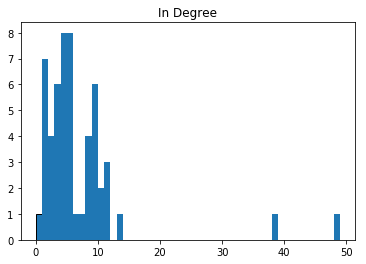

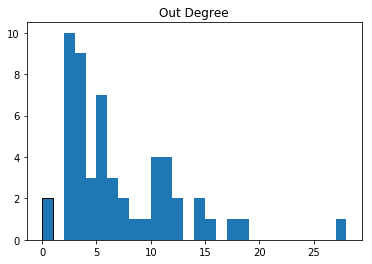

== Betweenness ==


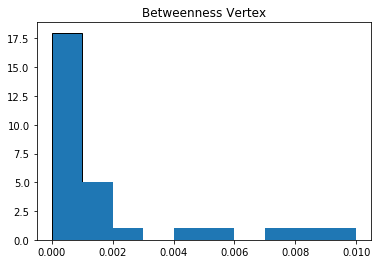

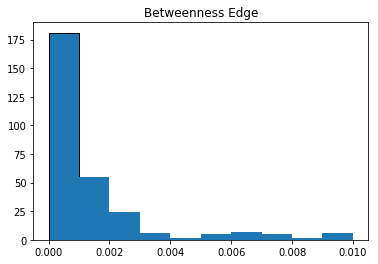

== Pagerank ==


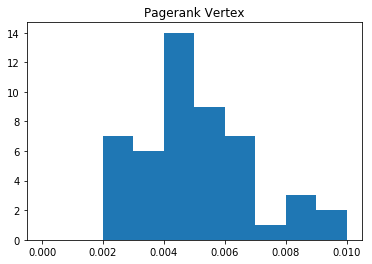

In [56]:
print("== Avg Degrees ==")
print(gt.vertex_average(g, "in"))
print(gt.vertex_average(g, "out"))
print("== Histograms ==")
frq, edges = gt.vertex_hist(g, "in")
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("In Degree")
plt.show()

frq, edges = gt.vertex_hist(g, "out")
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Out Degree")
plt.show()

print("== Betweenness ==")
frq, edges = gt.vertex_hist(g, vp, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Betweenness Vertex")
plt.show()

frq, edges = gt.edge_hist(g, ep, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Betweenness Edge")
plt.show()

print("== Pagerank ==")
frq, edges = gt.vertex_hist(g, pr, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Pagerank Vertex")
plt.show()

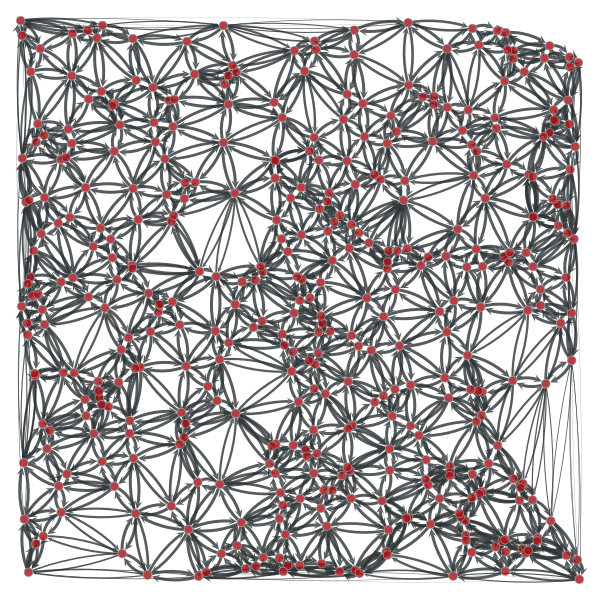

48.07114977497447


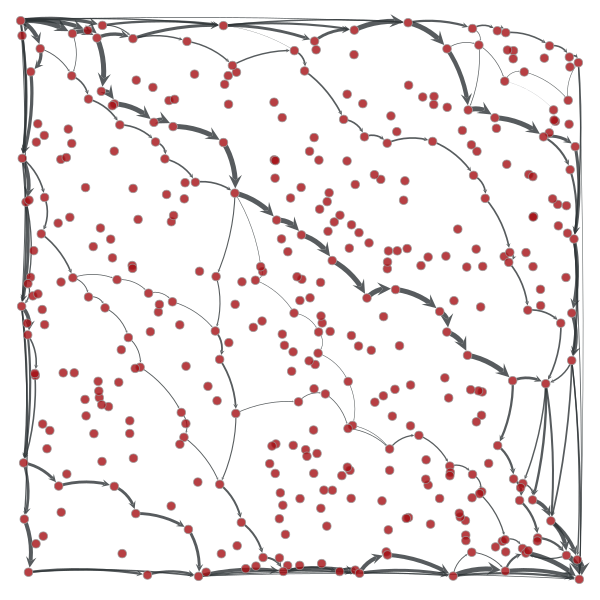

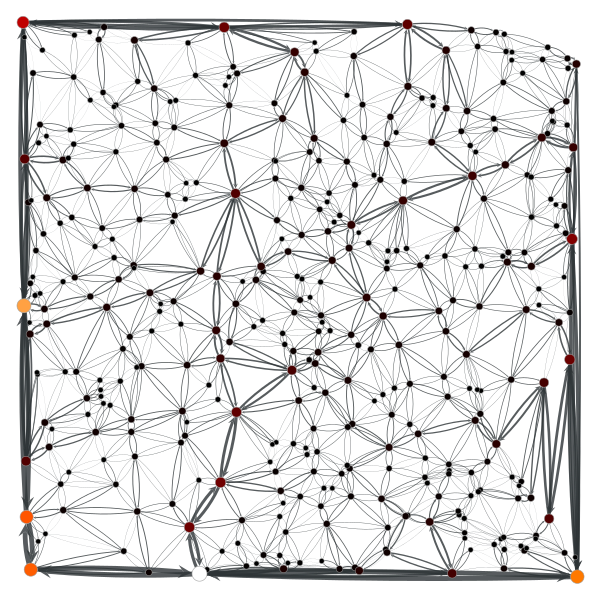

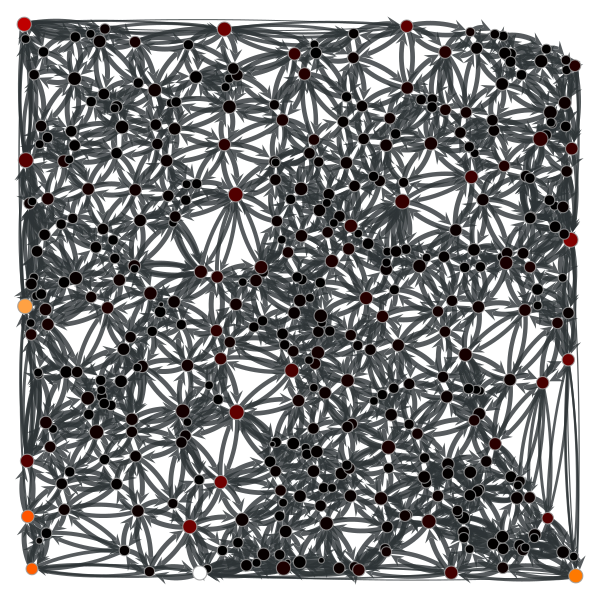

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fb76aa02780, at 0x7fb76aa02c50>

In [64]:
points = numpy.random.random((400, 2))
points[0] = [0, 0]
points[1] = [1, 1]
g, pos = gt.triangulation(points, type="delaunay")
g.set_directed(True)
edges = list(g.edges())
# reciprocate edges
for e in edges:
    g.add_edge(e.target(), e.source())
# The capacity will be defined as the inverse euclidean distance
cap = g.new_edge_property("double")
for e in g.edges():
    cap[e] = min(1.0 / norm(pos[e.target()].a - pos[e.source()].a), 10)
g.edge_properties["cap"] = cap
g.vertex_properties["pos"] = pos
gt.graph_draw(g, pos=pos, edge_pen_width=gt.prop_to_size(cap, mi=0, ma=3, power=1))

src, tgt = g.vertex(0), g.vertex(1)
res = gt.edmonds_karp_max_flow(g, src, tgt, cap)
res.a = cap.a - res.a  # the actual flow
max_flow = sum(res[e] for e in tgt.in_edges())
print(max_flow)
pos = g.vertex_properties["pos"]
gt.graph_draw(g, pos=pos, edge_pen_width=gt.prop_to_size(res, mi=0, ma=5, power=1))

vp, ep = gt.betweenness(g, weight=cap)
gt.graph_draw(g, pos=pos, vertex_fill_color=vp, vertex_size=gt.prop_to_size(vp, mi=5, ma=15), edge_pen_width=gt.prop_to_size(ep, mi=0.0, ma=5), vcmap=matplotlib.cm.gist_heat)

pr = gt.pagerank(g)
gt.graph_draw(g, pos=pos, vertex_fill_color=vp, vertex_size=gt.prop_to_size(pr, mi=5, ma=15), edge_pen_width=gt.prop_to_size(cap, mi=0.0, ma=5), vcmap=matplotlib.cm.gist_heat)

== Avg Degrees ==
(5.92, 0.070331358582072054)
(5.92, 0.070331358582072054)
== Histograms ==


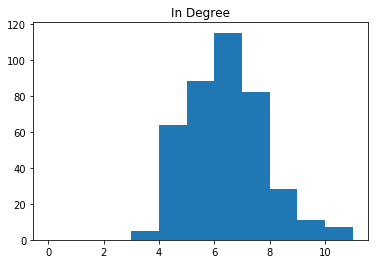

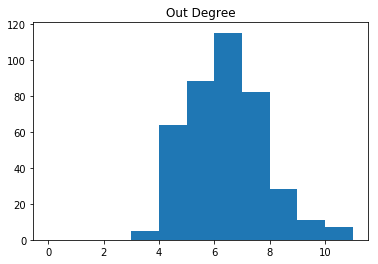

== Betweenness ==


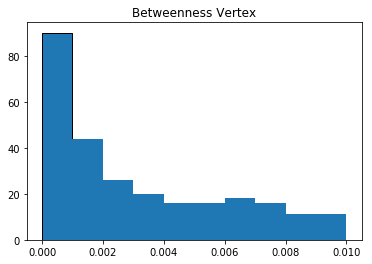

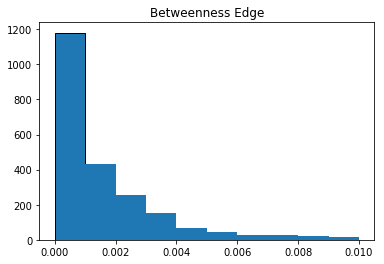

== Pagerank ==


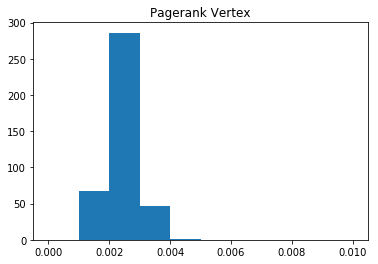

In [65]:
print("== Avg Degrees ==")
print(gt.vertex_average(g, "in"))
print(gt.vertex_average(g, "out"))
print("== Histograms ==")
frq, edges = gt.vertex_hist(g, "in")
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("In Degree")
plt.show()

frq, edges = gt.vertex_hist(g, "out")
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Out Degree")
plt.show()

print("== Betweenness ==")
frq, edges = gt.vertex_hist(g, vp, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Betweenness Vertex")
plt.show()

frq, edges = gt.edge_hist(g, ep, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Betweenness Edge")
plt.show()

print("== Pagerank ==")
frq, edges = gt.vertex_hist(g, pr, bins=[0, .001, .002, .003, .004, .005, .006, .007, .008, .009, .01])
fig, ax = plt.subplots()
ax.bar(edges[:-1], frq, width=numpy.diff(edges), ec="k", align="edge")
plt.title("Pagerank Vertex")
plt.show()